In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
from zoneinfo import ZoneInfo

all_norm_datasets = []

scope_29  SNR: 29.56
scope_30  SNR: 32.13
scope_31  SNR: 31.27
scope_32  SNR: 31.82
scope_33  SNR: 30.13
scope_34  SNR: 30.77
scope_35  SNR: 31.44
scope_36  SNR: 32.70
scope_37  SNR: 31.52
scope_38  SNR: 29.56
scope_39  SNR: 31.35
scope_40  SNR: 33.33
scope_41  SNR: 32.98
scope_42  SNR: 34.76
scope_43  SNR: 33.28
scope_44  SNR: 32.84
scope_45  SNR: 36.61
scope_46  SNR: 34.72
scope_47  SNR: 37.03
scope_48  SNR: 30.02
scope_49  SNR: 27.18
scope_50  SNR: 26.64
scope_51  SNR: 28.05
scope_52  SNR: 27.59
scope_53  SNR: 26.66
scope_54  SNR: 28.55
scope_55  SNR: 31.05
scope_56  SNR: 32.72
scope_57  SNR: 33.67
scope_58  SNR: 37.95
scope_59  SNR: 38.58
scope_60  SNR: 40.02
scope_61  SNR: 25.68
scope_62  SNR: 23.64


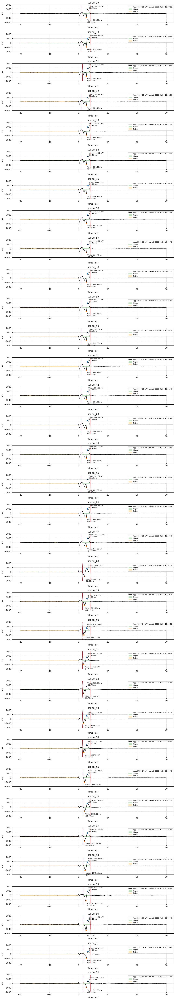

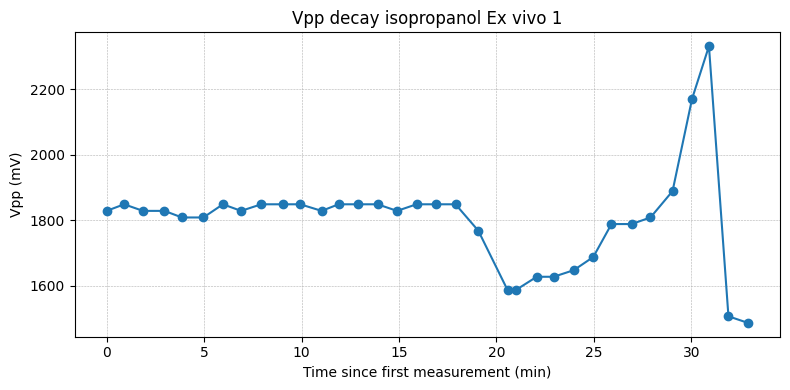

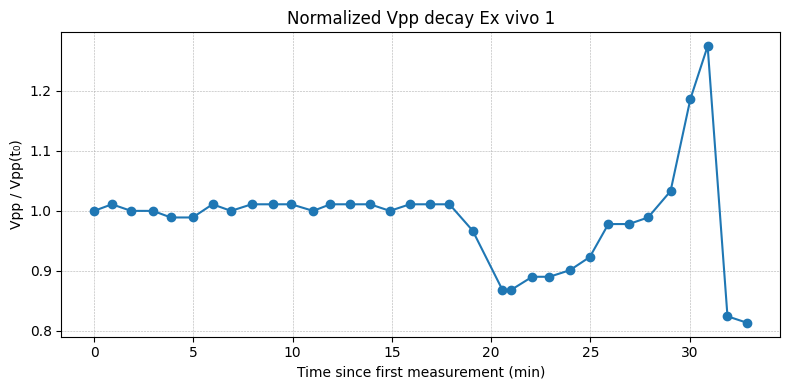


Average SNR (linear): 31.64
Average SNR (dB): 30.01 dB
Average Vpp: 1801.36 mV


In [14]:
#EX VIVO 1
folder = "Ex vivo 1"
scope_start = 29
num_files = 34

time_windows = [
    (1.1, 4),   # Scope_29
    (1.1, 4),   # Scope_30
    (1.3, 4),   # Scope_31
    (1.1, 4),   # Scope_32
    (1.1, 4),   # Scope_33
    (1.1, 4),   # Scope_34
    (1.1, 4),   # Scope_35
    (1.1, 4),   # Scope_36
    (1.1, 4),   # Scope_37
    (1.1, 4),   # Scope_38
    (1.1, 4),   # Scope_39
    (1.1, 4),   # Scope_40
    (1.1, 4),   # Scope_41
    (1.1, 4),   # Scope_42
    (1.1, 4),   # Scope_43
    (1.1, 4),   # Scope_44
    (1.1, 4),   # Scope_45
    (1.1, 4),   # Scope_46
    (1.1, 4),   # Scope_47
    (1.3, 4),   # Scope_48
    (1.3, 4),   # Scope_49
    (1.3, 4),   # Scope_50
    (1.3, 4),   # Scope_51
    (1.3, 4),   # Scope_52
    (1.3, 4),   # Scope_53
    (1.3, 4),   # Scope_54
    (1.5, 4),   # Scope_55
    (1.5, 4),   # Scope_56
    (1.5, 4),   # Scope_57
    (1.5, 4),   # Scope_58
    (1.5, 4),   # Scope_59
    (1.5, 4.1),   # Scope_60
    (1.5, 4),   # Scope_61
    (1.5, 4.1),   # Scope_62
]

vpp_values = []
timestamps = []
snr_values = []

fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")
    t_start, t_end = time_windows[i]

    df = pd.read_csv(file_path)
    df = df.drop(index=0).reset_index(drop=True)
    df = df.apply(pd.to_numeric)

    t_ms = df["x-axis"].values * 1e3
    ch2_mV = df["2"].values * 1e3

    mtime = os.path.getmtime(file_path)
    ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
    timestamps.append(ts)
    timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")

    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    signal_vals = ch2_mV[signal_mask]
    vmax = np.max(signal_vals)
    vmin = np.min(signal_vals)
    vpp = vmax - vmin
    vpp_values.append(vpp)

    seg_indices = np.where(signal_mask)[0]
    idx_vmax = seg_indices[np.argmax(ch2_mV[seg_indices])]
    idx_vmin = seg_indices[np.argmin(ch2_mV[seg_indices])]
    vmax_t = t_ms[idx_vmax]
    vmin_t = t_ms[idx_vmin]

    signal_vrms = np.sqrt(np.mean(ch2_mV[signal_mask] ** 2))
    noise_vrms = np.sqrt(np.mean(ch2_mV[noise_mask] ** 2))
    snr = signal_vrms / noise_vrms
    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    ax.scatter(vmax_t, vmax, s=30)
    ax.scatter(vmin_t, vmin, s=30)

    ax.annotate(
        f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
        (vmax_t, vmax),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=8,
    )
    ax.annotate(
        f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
        (vmin_t, vmin),
        xytext=(5, -24),
        textcoords="offset points",
        fontsize=8,
    )

    ax.set_ylim(-2000, 2000)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

pairs = sorted(zip(timestamps, vpp_values), key=lambda x: x[0])
t0 = pairs[0][0]

time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in pairs])
vpp_arr = np.array([vpp for _, vpp in pairs])

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_arr, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp (mV)")
plt.title(f"Vpp decay isopropanol {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

vpp_norm = vpp_arr / vpp_arr[0]

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_norm, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp / Vpp(t₀)")
plt.title(f"Normalized Vpp decay {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

snr_mean = np.mean(snr_values)
snr_mean_db = 20 * np.log10(snr_mean)
print(f"\nAverage SNR (linear): {snr_mean:.2f}")
print(f"Average SNR (dB): {snr_mean_db:.2f} dB")

vpp_mean = np.mean(vpp_values)
print(f"Average Vpp: {vpp_mean:.2f} mV")

all_norm_datasets.append({
    "time_min": time_min,
    "vpp_norm": vpp_arr / vpp_arr[0],
    "label": folder
})


scope_63  SNR: 30.41
scope_64  SNR: 32.77
scope_65  SNR: 35.89
scope_66  SNR: 28.39
scope_67  SNR: 30.90
scope_68  SNR: 28.71
scope_69  SNR: 28.81
scope_70  SNR: 29.38
scope_71  SNR: 26.61
scope_72  SNR: 27.06
scope_73  SNR: 27.59
scope_74  SNR: 26.63
scope_75  SNR: 25.15
scope_76  SNR: 26.06
scope_77  SNR: 24.90
scope_78  SNR: 26.40
scope_79  SNR: 26.83
scope_80  SNR: 27.98
scope_81  SNR: 25.92
scope_82  SNR: 27.06
scope_83  SNR: 29.72
scope_84  SNR: 27.05
scope_85  SNR: 28.39
scope_86  SNR: 22.90


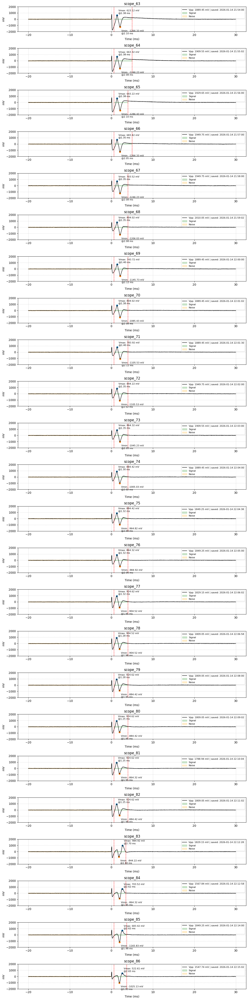

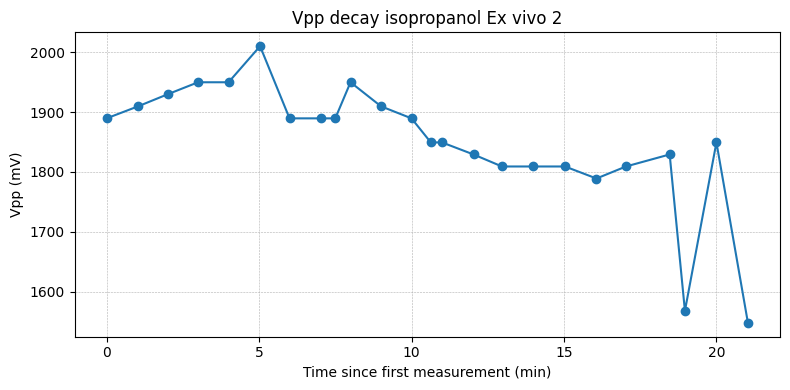

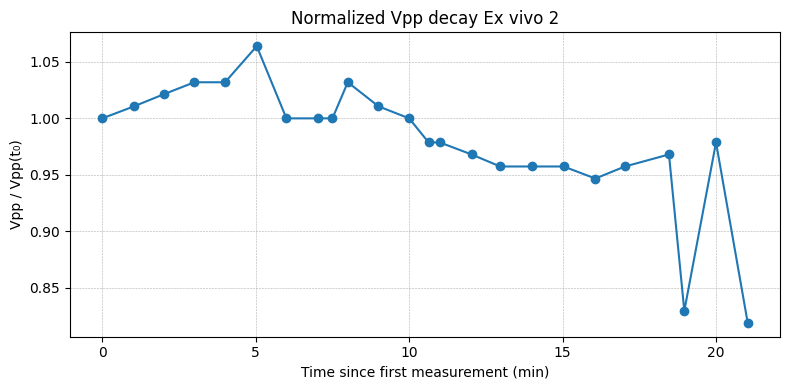


Average SNR (linear): 27.98
Average SNR (dB): 28.94 dB
Average Vpp: 1850.08 mV


In [15]:
#EX VIVO 2
folder = "Ex vivo 2"
scope_start = 63
num_files = 24

time_windows = [
    (0.6, 5),   # Scope_63
    (0.6, 5),   # Scope_64
    (0.6, 4),   # Scope_65
    (0.6, 5),   # Scope_66
    (0.6, 4),   # Scope_67
    (0.6, 4),   # Scope_68
    (0.6, 4),   # Scope_69
    (0.6, 4),   # Scope_70
    (0.6, 4),   # Scope_71
    (0.6, 4),   # Scope_72
    (0.6, 4),   # Scope_73
    (0.6, 4),   # Scope_74
    (0.6, 4),   # Scope_75
    (0.6, 4),   # Scope_76
    (0.6, 4),   # Scope_77
    (0.6, 4),   # Scope_78
    (0.6, 4),   # Scope_79
    (0.6, 4),   # Scope_80
    (0.6, 4),   # Scope_81
    (0.6, 4),   # Scope_82
    (0.6, 3.5),   # Scope_83
    (0.6, 3.5),   # Scope_84
    (0.6, 3.7),   # Scope_85
    (0.6, 3.7),   # Scope_86
]

vpp_values = []
timestamps = []
snr_values = []

fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")
    t_start, t_end = time_windows[i]

    df = pd.read_csv(file_path)
    df = df.drop(index=0).reset_index(drop=True)
    df = df.apply(pd.to_numeric)

    t_ms = df["x-axis"].values * 1e3
    ch2_mV = df["2"].values * 1e3

    mtime = os.path.getmtime(file_path)
    ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
    timestamps.append(ts)
    timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")

    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    signal_vals = ch2_mV[signal_mask]
    vmax = np.max(signal_vals)
    vmin = np.min(signal_vals)
    vpp = vmax - vmin
    vpp_values.append(vpp)

    seg_indices = np.where(signal_mask)[0]
    idx_vmax = seg_indices[np.argmax(ch2_mV[seg_indices])]
    idx_vmin = seg_indices[np.argmin(ch2_mV[seg_indices])]
    vmax_t = t_ms[idx_vmax]
    vmin_t = t_ms[idx_vmin]

    signal_vrms = np.sqrt(np.mean(ch2_mV[signal_mask] ** 2))
    noise_vrms = np.sqrt(np.mean(ch2_mV[noise_mask] ** 2))
    snr = signal_vrms / noise_vrms
    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    ax.scatter(vmax_t, vmax, s=30)
    ax.scatter(vmin_t, vmin, s=30)

    ax.annotate(
        f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
        (vmax_t, vmax),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=8,
    )
    ax.annotate(
        f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
        (vmin_t, vmin),
        xytext=(5, -24),
        textcoords="offset points",
        fontsize=8,
    )

    ax.set_ylim(-2000, 2000)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

pairs = sorted(zip(timestamps, vpp_values), key=lambda x: x[0])
t0 = pairs[0][0]

time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in pairs])
vpp_arr = np.array([vpp for _, vpp in pairs])

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_arr, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp (mV)")
plt.title(f"Vpp decay isopropanol {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

vpp_norm = vpp_arr / vpp_arr[0]

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_norm, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp / Vpp(t₀)")
plt.title(f"Normalized Vpp decay {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

snr_mean = np.mean(snr_values)
snr_mean_db = 20 * np.log10(snr_mean)
print(f"\nAverage SNR (linear): {snr_mean:.2f}")
print(f"Average SNR (dB): {snr_mean_db:.2f} dB")

vpp_mean = np.mean(vpp_values)
print(f"Average Vpp: {vpp_mean:.2f} mV")

all_norm_datasets.append({
    "time_min": time_min,
    "vpp_norm": vpp_arr / vpp_arr[0],
    "label": folder
})

scope_88  SNR: 32.87
scope_89  SNR: 35.50
scope_90  SNR: 29.80
scope_91  SNR: 30.59
scope_92  SNR: 37.36
scope_93  SNR: 37.36
scope_94  SNR: 36.88
scope_95  SNR: 37.43
scope_96  SNR: 28.36
scope_97  SNR: 31.19
scope_98  SNR: 37.27
scope_99  SNR: 38.49
scope_100  SNR: 39.36
scope_101  SNR: 39.27
scope_102  SNR: 35.12
scope_103  SNR: 39.81
scope_104  SNR: 38.41
scope_105  SNR: 38.13
scope_106  SNR: 37.54
scope_107  SNR: 38.32
scope_108  SNR: 37.57
scope_109  SNR: 40.59
scope_110  SNR: 38.23
scope_111  SNR: 42.95
scope_112  SNR: 37.54
scope_113  SNR: 38.83
scope_114  SNR: 39.31
scope_115  SNR: 31.28
scope_116  SNR: 26.57
scope_117  SNR: 33.34
scope_118  SNR: 37.18
scope_119  SNR: 37.34
scope_120  SNR: 41.30
scope_121  SNR: 39.85
scope_122  SNR: 40.01
scope_123  SNR: 34.92
scope_124  SNR: 33.35
scope_125  SNR: 36.34
scope_126  SNR: 34.89
scope_127  SNR: 36.32
scope_128  SNR: 33.53
scope_129  SNR: 34.58
scope_130  SNR: 34.88
scope_131  SNR: 36.19
scope_132  SNR: 35.38
scope_133  SNR: 34.82


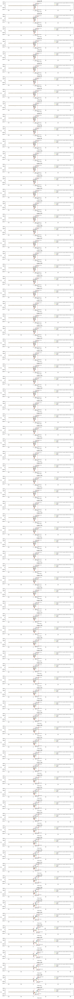

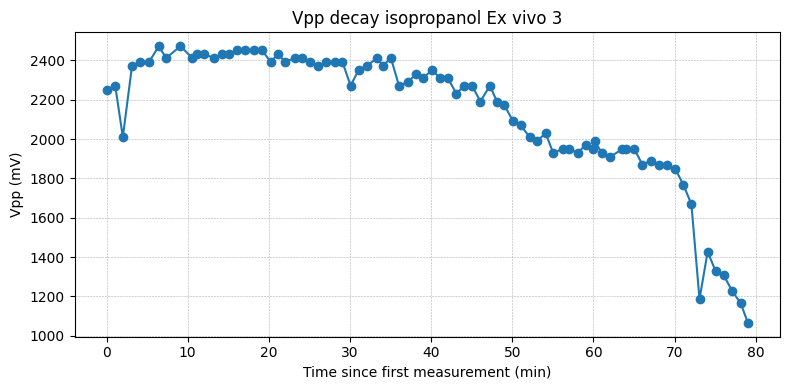

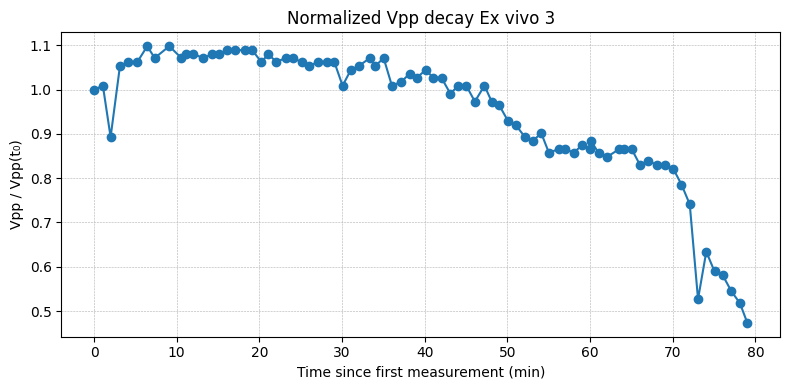


Average SNR (linear): 33.40
Average SNR (dB): 30.47 dB
Average Vpp: 2129.90 mV


In [16]:
#EX VIVO 3
folder = "Ex vivo 3"
scope_start = 88
num_files = 80

time_windows = [
    (0.6, 3.5),   # Scope_88
    (0.6, 3.5),   # Scope_89
    (0.6, 3.5),   # Scope_90
    (0.6, 3.5),   # Scope_91
    (0.6, 3.5),   # Scope_92
    (0.6, 3.5),   # Scope_93
    (0.6, 3.5),   # Scope_94
    (0.6, 3.5),   # Scope_95
    (0.6, 3.5),   # Scope_96
    (0.6, 3.5),   # Scope_97
    (0.6, 3.5),   # Scope_98
    (0.6, 3.5),   # Scope_99
    (0.6, 3.5),   # Scope_100
    (0.6, 3.5),   # Scope_101
    (0.6, 3.5),   # Scope_102
    (0.6, 3.5),   # Scope_103
    (0.6, 3.5),   # Scope_104
    (0.6, 3.5),   # Scope_105
    (0.6, 3.5),   # Scope_106
    (0.6, 3.5),   # Scope_107
    (0.6, 3.5),   # Scope_108
    (0.6, 3.5),   # Scope_109
    (0.6, 3.5),   # Scope_110
    (0.6, 3.5),   # Scope_111
    (0.6, 3.5),   # Scope_112
    (0.6, 3.5),   # Scope_113
    (0.6, 3.5),   # Scope_114
    (0.6, 3.5),   # Scope_115
    (0.6, 3.7),   # Scope_116
    (0.6, 3.7),   # Scope_117
    (0.6, 3.7),   # Scope_118
    (0.6, 3.7),   # Scope_119
    (0.6, 3.7),   # Scope_120
    (0.6, 3.7),   # Scope_121
    (0.6, 3.7),   # Scope_122
    (0.6, 3.7),   # Scope_123
    (0.6, 3.5),   # Scope_124
    (0.6, 3.7),   # Scope_125
    (0.6, 3.7),   # Scope_126
    (0.6, 3.7),   # Scope_127
    (0.6, 3.7),   # Scope_128
    (0.6, 3.7),   # Scope_129
    (0.6, 3.7),   # Scope_130
    (0.6, 3.8),   # Scope_131
    (0.6, 3.8),   # Scope_132
    (0.6, 3.8),   # Scope_133
    (0.6, 3.8),   # Scope_134
    (0.6, 3.8),   # Scope_135
    (0.6, 4),   # Scope_136
    (0.6, 4),   # Scope_137
    (0.6, 4),   # Scope_138
    (0.6, 4),   # Scope_139
    (0.6, 3.7),   # Scope_140
    (0.6, 4.1),   # Scope_141
    (0.6, 4.1),   # Scope_142
    (0.6, 4.1),   # Scope_143
    (0.7, 4.1),   # Scope_144
    (0.7, 4.1),   # Scope_145
    (0.7, 4.3),   # Scope_146
    (0.7, 4.3),   # Scope_147
    (0.7, 4.3),   # Scope_148
    (0.7, 4.3),   # Scope_149
    (0.7, 4.3),   # Scope_150
    (0.7, 4.3),   # Scope_151
    (0.7, 4.3),   # Scope_152
    (0.7, 4.3),   # Scope_153
    (0.7, 4.3),   # Scope_154
    (0.7, 4.3),   # Scope_155
    (0.7, 4.3),   # Scope_156
    (0.7, 4.1),   # Scope_157
    (0.7, 4.3),   # Scope_158
    (0.7, 4.1),   # Scope_159
    (0.7, 4.1),   # Scope_160
    (0.7, 4.1),   # Scope_161
    (0.7, 4.3),   # Scope_162
    (0.7, 4.3),   # Scope_163
    (0.7, 4.1),   # Scope_164
    (0.7, 4.1),   # Scope_165
    (0.7, 4.1),   # Scope_166
    (0.7, 4.5),   # Scope_167
]


vpp_values = []
timestamps = []
snr_values = []

fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")
    t_start, t_end = time_windows[i]

    df = pd.read_csv(file_path)
    df = df.drop(index=0).reset_index(drop=True)
    df = df.apply(pd.to_numeric)

    t_ms = df["x-axis"].values * 1e3
    ch2_mV = df["2"].values * 1e3

    mtime = os.path.getmtime(file_path)
    ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
    timestamps.append(ts)
    timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")

    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    signal_vals = ch2_mV[signal_mask]
    vmax = np.max(signal_vals)
    vmin = np.min(signal_vals)
    vpp = vmax - vmin
    vpp_values.append(vpp)

    seg_indices = np.where(signal_mask)[0]
    idx_vmax = seg_indices[np.argmax(ch2_mV[seg_indices])]
    idx_vmin = seg_indices[np.argmin(ch2_mV[seg_indices])]
    vmax_t = t_ms[idx_vmax]
    vmin_t = t_ms[idx_vmin]

    signal_vrms = np.sqrt(np.mean(ch2_mV[signal_mask] ** 2))
    noise_vrms = np.sqrt(np.mean(ch2_mV[noise_mask] ** 2))
    snr = signal_vrms / noise_vrms
    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    ax.scatter(vmax_t, vmax, s=30)
    ax.scatter(vmin_t, vmin, s=30)

    ax.annotate(
        f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
        (vmax_t, vmax),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=8,
    )
    ax.annotate(
        f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
        (vmin_t, vmin),
        xytext=(5, -24),
        textcoords="offset points",
        fontsize=8,
    )

    ax.set_ylim(-2000, 2000)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

pairs = sorted(zip(timestamps, vpp_values), key=lambda x: x[0])
t0 = pairs[0][0]

time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in pairs])
vpp_arr = np.array([vpp for _, vpp in pairs])

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_arr, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp (mV)")
plt.title(f"Vpp decay isopropanol {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

vpp_norm = vpp_arr / vpp_arr[0]

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_norm, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp / Vpp(t₀)")
plt.title(f"Normalized Vpp decay {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

snr_mean = np.mean(snr_values)
snr_mean_db = 20 * np.log10(snr_mean)
print(f"\nAverage SNR (linear): {snr_mean:.2f}")
print(f"Average SNR (dB): {snr_mean_db:.2f} dB")

vpp_mean = np.mean(vpp_values)
print(f"Average Vpp: {vpp_mean:.2f} mV")

all_norm_datasets.append({
    "time_min": time_min,
    "vpp_norm": vpp_arr / vpp_arr[0],
    "label": folder
})

In [ ]:
#EX VIVO 4
folder = "Ex vivo 4"
scope_start = 182
num_files = 217

time_windows = [
    (3.2, 9),   # Scope_182
    (3.2, 9),   # Scope_183
    (3.2, 9),   # Scope_184
    (3.2, 9),   # Scope_185
    (3.2, 9),   # Scope_186
    (3.2, 9),   # Scope_187
    (3.2, 9),   # Scope_188
    (3.2, 9),   # Scope_189
    (3.2, 9),   # Scope_190
    (3.2, 9),   # Scope_191
    (3.2, 9),   # Scope_192
    (3.2, 9),   # Scope_193
    (3.2, 9),   # Scope_194
    (3.5, 6),   # Scope_195
    (3.4, 6),   # Scope_196
    (3.5, 6),   # Scope_197
    (3.5, 6),   # Scope_198
    (3.5, 6),   # Scope_199
    (3.5, 6),   # Scope_200
    (3.7, 6.2),   # Scope_201
    (3.5, 6),   # Scope_202
    (3.5, 6),   # Scope_203
    (3.5, 6),   # Scope_204
    (3.5, 6),   # Scope_205
    (3.5, 6),   # Scope_206
    (3.5, 6),   # Scope_207
    (3.5, 6),   # Scope_208
    (3.5, 6),   # Scope_209
    (3.5, 6),   # Scope_210
    (3.5, 6),   # Scope_211
    (3.5, 6.1),   # Scope_212
    (3.5, 6.1),   # Scope_213
    (3.5, 6.5),   # Scope_214
    (3.5, 6.6),   # Scope_215
    (3.5, 6.6),   # Scope_216
    (3.5, 6.6),   # Scope_217
    (3.5, 6.6),   # Scope_218
    (3.5, 6.6),   # Scope_219
    (3.5, 6.6),   # Scope_220
    (3.5, 6.6),   # Scope_221
    (3.5, 6.7),   # Scope_222
    (3.5, 6.7),   # Scope_223
    (3.5, 6.7),   # Scope_224
    (3.5, 6.7),   # Scope_225
    (3.5, 6.7),   # Scope_226
    (3.5, 6.7),   # Scope_227
    (3.5, 6.7),   # Scope_228
    (3.5, 6.7),   # Scope_229
    (3.5, 6.7),   # Scope_230
    (3.5, 6.7),   # Scope_231
    (3.5, 6.7),   # Scope_232
    (3.5, 6.8),   # Scope_233
    (3.5, 6.8),   # Scope_234
    (3.5, 6.8),   # Scope_235
    (3.5, 6.8),   # Scope_236
    (3.5, 6.8),   # Scope_237
    (3.5, 6.8),   # Scope_238
    (3.5, 6.8),   # Scope_239
    (3.5, 6.8),   # Scope_240
    (3.5, 6.8),   # Scope_241
    (3.5, 6.8),   # Scope_242
    (3.5, 6.8),   # Scope_243
    (3.5, 6.8),   # Scope_244
    (3.5, 6.8),   # Scope_245
    (3.5, 6.8),   # Scope_246
    (3.5, 6.8),   # Scope_247
    (3.6, 7.1),   # Scope_248
    (3.6, 7.1),   # Scope_249
    (3.7, 7.2),   # Scope_250
    (3.7, 7.3),   # Scope_251
    (3.8, 7.3),   # Scope_252
    (7.4, 11.8),   # Scope_253
    (7.4, 11.8),   # Scope_254
    (7.4, 11.8),   # Scope_255
    (8.3, 12.2),   # Scope_256
    (7.5, 11.4),   # Scope_257
    (8.5, 12.7),   # Scope_258
    (8.5, 12.7),   # Scope_259
    (8.5, 12.7),   # Scope_260
    (8.5, 12.7),   # Scope_261
    (8.5, 12.7),   # Scope_262
    (8.5, 12.7),   # Scope_263
    (8.5, 12.7),   # Scope_264
    (8.5, 12.7),   # Scope_265
    (8.5, 12.7),   # Scope_266
    (8.5, 12.7),   # Scope_267
    (8.5, 12.7),   # Scope_268
    (8.5, 12.7),   # Scope_269
    (8.6, 12.7),   # Scope_270
    (9.0, 12.9),   # Scope_271
    (9.0, 12.9),   # Scope_272
    (9.0, 12.9),   # Scope_273
    (9.0, 12.9),   # Scope_274
    (8.6, 12.7),   # Scope_275
    (8.6, 12.7),   # Scope_276
    (8.6, 12.7),   # Scope_277
    (8.7, 12.7),   # Scope_278
    (8.7, 12.7),   # Scope_279
    (8.7, 12.7),   # Scope_280
    (8.7, 12.7),   # Scope_281
    (8.7, 12.7),   # Scope_282
    (8.7, 12.7),   # Scope_283
    (8.7, 12.7),   # Scope_284
    (8.7, 12.7),   # Scope_285
    (8.7, 12.7),   # Scope_286
    (8.7, 12.7),   # Scope_287
    (8.7, 12.7),   # Scope_288
    (8.7, 12.7),   # Scope_289
    (8.7, 12.7),   # Scope_290
    (8.7, 12.7),   # Scope_291
    (8.7, 12.7),   # Scope_292
    (8.7, 12.7),   # Scope_293
    (8.7, 12.7),   # Scope_294
    (8.7, 12.7),   # Scope_295
    (8.7, 12.7),   # Scope_296
    (8.7, 13.3),   # Scope_297
    (9.0, 13.6),   # Scope_298
    (9.0, 13.6),   # Scope_299
    (9.0, 13.6),   # Scope_300
    (9.0, 13.6),   # Scope_301
    (9.0, 13.6),   # Scope_302
    (9.0, 13.6),   # Scope_303
    (9.0, 13.6),   # Scope_304
    (9.0, 13.6),   # Scope_305
    (9.4, 13.6),   # Scope_306
    (9.4, 13.6),   # Scope_307
    (9.5, 13.6),   # Scope_308
    (9.4, 13.6),   # Scope_309
    (9.5, 13.6),   # Scope_310
    (9.5, 13.6),   # Scope_311
    (9.7, 13.6),   # Scope_312
    (9.8, 13.6),   # Scope_313
    (10.2, 15.0),   # Scope_314
    (10.2, 15.0),   # Scope_315
    (10.5, 16.2),   # Scope_316
    (10.5, 16.2),   # Scope_317
    (10.5, 16.2),   # Scope_318
    (10.5, 16.2),   # Scope_319
    (10.5, 16.2),   # Scope_320
    (10.5, 16.2),   # Scope_321
    (10.5, 16.2),   # Scope_322
    (10.5, 16.2),   # Scope_323
    (10.5, 16.2),   # Scope_324
    (10.5, 16.2),   # Scope_325
    (10.5, 16.2),   # Scope_326
    (10.5, 16.2),   # Scope_327
    (10.5, 16.2),   # Scope_328
    (10.7, 16.2),   # Scope_329
    (10.7, 16.2),   # Scope_330
    (10.7, 16.2),   # Scope_331
    (10.7, 16.2),   # Scope_332
    (10.7, 16.2),   # Scope_333
    (10.7, 16.2),   # Scope_334
    (10.7, 16.2),   # Scope_335
    (10.7, 16.2),   # Scope_336
    (10.7, 16.2),   # Scope_337
    (10.7, 16.2),   # Scope_338
    (10.7, 16.2),   # Scope_339
    (10.7, 16.2),   # Scope_340
    (10.7, 16.2),   # Scope_341
    (11.0, 16.2),   # Scope_342
    (11.0, 16.2),   # Scope_343
    (11.0, 16.2),   # Scope_344
    (11.0, 16.2),   # Scope_345
    (11.0, 16.2),   # Scope_346
    (11.0, 16.2),   # Scope_347
    (11.0, 16.2),   # Scope_348
    (11.0, 16.2),   # Scope_349
    (11.0, 16.2),   # Scope_350
    (11.0, 16.2),   # Scope_351
    (11.0, 16.2),   # Scope_352
    (11.0, 16.2),   # Scope_353
    (11.0, 16.2),   # Scope_354
    (11.0, 16.2),   # Scope_355
    (11.0, 16.2),   # Scope_356
    (11.0, 16.2),   # Scope_357
    (11.0, 16.2),   # Scope_358
    (11.0, 16.2),   # Scope_359
    (11.0, 16.2),   # Scope_360
    (11.0, 16.2),   # Scope_361
    (11.0, 16.2),   # Scope_362
    (11.0, 16.2),   # Scope_363
    (11.0, 16.2),   # Scope_364
    (11.0, 16.2),   # Scope_365
    (11.0, 16.2),   # Scope_366
    (11.0, 16.2),   # Scope_367
    (11.0, 16.2),   # Scope_368
    (11.0, 16.2),   # Scope_369
    (11.2, 16.2),   # Scope_370
    (11.2, 16.2),   # Scope_371
    (11.2, 16.2),   # Scope_372
    (11.2, 16.2),   # Scope_373
    (11.2, 16.2),   # Scope_374
    (11.2, 16.2),   # Scope_375
    (11.2, 16.2),   # Scope_376
    (11.2, 16.2),   # Scope_377
    (11.3, 16.2),   # Scope_378
    (11.3, 16.2),   # Scope_379
    (11.3, 16.2),   # Scope_380
    (11.3, 16.2),   # Scope_381
    (11.3, 16.2),   # Scope_382
    (11.3, 16.2),   # Scope_383
    (11.7, 16.2),   # Scope_384
    (11.7, 16.2),   # Scope_385
    (11.7, 16.2),   # Scope_386
    (11.7, 16.2),   # Scope_387
    (11.3, 16.2),   # Scope_388
    (12, 20),   # Scope_389
    (12, 20),   # Scope_390
    (12.2, 20),   # Scope_391
    (12.2, 20),   # Scope_392
    (12.2, 20),   # Scope_393
    (12.2, 20),   # Scope_394
    (12.2, 20),   # Scope_395
    (12.2, 20),   # Scope_396
    (12.2, 20),   # Scope_397
    (12.2, 20),   # Scope_398
]

vpp_values = []
timestamps = []
snr_values = []

fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")
    t_start, t_end = time_windows[i]

    df = pd.read_csv(file_path)
    df = df.drop(index=0).reset_index(drop=True)
    df = df.apply(pd.to_numeric)

    t_ms = df["x-axis"].values * 1e3
    ch2_mV = df["2"].values * 1e3

    mtime = os.path.getmtime(file_path)
    ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
    timestamps.append(ts)
    timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")

    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    signal_vals = ch2_mV[signal_mask]
    vmax = np.max(signal_vals)
    vmin = np.min(signal_vals)
    vpp = vmax - vmin
    vpp_values.append(vpp)

    seg_indices = np.where(signal_mask)[0]
    idx_vmax = seg_indices[np.argmax(ch2_mV[seg_indices])]
    idx_vmin = seg_indices[np.argmin(ch2_mV[seg_indices])]
    vmax_t = t_ms[idx_vmax]
    vmin_t = t_ms[idx_vmin]

    signal_vrms = np.sqrt(np.mean(ch2_mV[signal_mask] ** 2))
    noise_vrms = np.sqrt(np.mean(ch2_mV[noise_mask] ** 2))
    snr = signal_vrms / noise_vrms
    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    ax.scatter(vmax_t, vmax, s=30)
    ax.scatter(vmin_t, vmin, s=30)

    ax.annotate(
        f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
        (vmax_t, vmax),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=8,
    )
    ax.annotate(
        f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
        (vmin_t, vmin),
        xytext=(5, -24),
        textcoords="offset points",
        fontsize=8,
    )

    ax.set_ylim(-2000, 2000)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

pairs = sorted(zip(timestamps, vpp_values), key=lambda x: x[0])
t0 = pairs[0][0]

time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in pairs])
vpp_arr = np.array([vpp for _, vpp in pairs])

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_arr, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp (mV)")
plt.title(f"Vpp decay isopropanol {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

vpp_norm = vpp_arr / vpp_arr[0]

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_norm, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp / Vpp(t₀)")
plt.title(f"Normalized Vpp decay {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

snr_mean = np.mean(snr_values)
snr_mean_db = 20 * np.log10(snr_mean)
print(f"\nAverage SNR (linear): {snr_mean:.2f}")
print(f"Average SNR (dB): {snr_mean_db:.2f} dB")

vpp_mean = np.mean(vpp_values)
print(f"Average Vpp: {vpp_mean:.2f} mV")

all_norm_datasets.append({
    "time_min": time_min,
    "vpp_norm": vpp_arr / vpp_arr[0],
    "label": folder
})


scope_182  SNR: 31.22
scope_183  SNR: 30.84
scope_184  SNR: 28.08
scope_185  SNR: 28.83
scope_186  SNR: 29.86
scope_187  SNR: 30.15
scope_188  SNR: 29.68
scope_189  SNR: 31.93
scope_190  SNR: 29.25
scope_191  SNR: 29.68
scope_192  SNR: 29.50
scope_193  SNR: 31.17
scope_194  SNR: 30.25
scope_195  SNR: 32.63
scope_196  SNR: 33.14
scope_197  SNR: 32.68
scope_198  SNR: 35.45
scope_199  SNR: 33.45
scope_200  SNR: 35.60
scope_201  SNR: 34.96
scope_202  SNR: 35.92
scope_203  SNR: 33.87
scope_204  SNR: 35.89
scope_205  SNR: 34.37
scope_206  SNR: 33.77
scope_207  SNR: 36.43
scope_208  SNR: 35.50
scope_209  SNR: 34.21
scope_210  SNR: 35.11
scope_211  SNR: 35.43
scope_212  SNR: 33.73
scope_213  SNR: 32.16
scope_214  SNR: 32.77
scope_215  SNR: 29.64
scope_216  SNR: 30.00
scope_217  SNR: 30.04
scope_218  SNR: 29.10
scope_219  SNR: 31.58
scope_220  SNR: 30.73
scope_221  SNR: 29.88
scope_222  SNR: 28.53
scope_223  SNR: 28.80
scope_224  SNR: 27.63
scope_225  SNR: 28.19
scope_226  SNR: 27.95
scope_227 

scope_400  SNR: 12.64
scope_401  SNR: 12.90
scope_402  SNR: 13.51
scope_403  SNR: 13.78
scope_404  SNR: 14.11
scope_405  SNR: 13.61
scope_406  SNR: 15.21
scope_407  SNR: 13.57
scope_408  SNR: 14.10
scope_409  SNR: 14.21
scope_410  SNR: 13.77
scope_411  SNR: 14.03
scope_412  SNR: 14.19
scope_413  SNR: 14.53
scope_414  SNR: 14.15
scope_415  SNR: 14.25
scope_416  SNR: 14.26
scope_417  SNR: 13.92
scope_418  SNR: 14.35
scope_419  SNR: 14.85
scope_420  SNR: 14.39
scope_421  SNR: 15.41
scope_422  SNR: 12.74
scope_423  SNR: 14.34
scope_424  SNR: 14.21
scope_425  SNR: 13.80
scope_426  SNR: 14.61
scope_427  SNR: 14.34
scope_428  SNR: 14.94
scope_429  SNR: 15.50
scope_430  SNR: 14.85
scope_431  SNR: 15.32
scope_432  SNR: 15.27
scope_433  SNR: 15.08
scope_434  SNR: 15.21
scope_435  SNR: 15.86
scope_436  SNR: 15.64
scope_437  SNR: 15.96
scope_438  SNR: 15.89
scope_439  SNR: 16.23
scope_440  SNR: 16.41
scope_441  SNR: 18.08
scope_442  SNR: 16.36
scope_443  SNR: 16.36
scope_444  SNR: 17.64
scope_445 

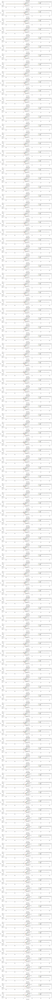

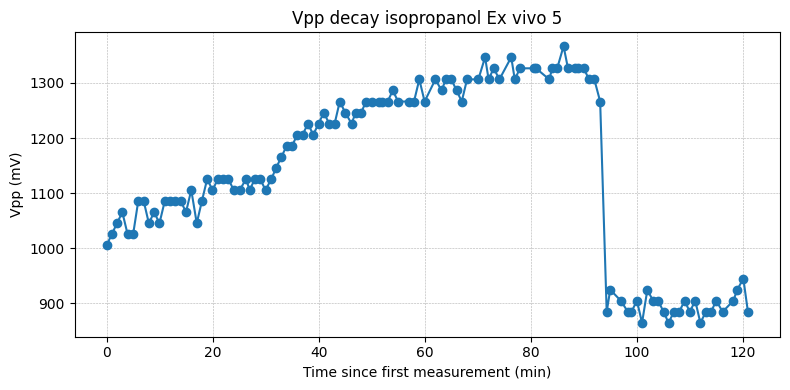

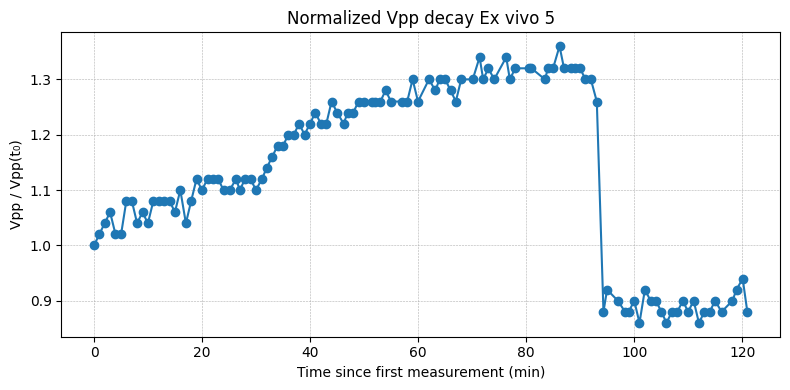


Average SNR (linear): 15.24
Average SNR (dB): 23.66 dB
Average Vpp: 1135.50 mV


In [ ]:
#EX VIVO 5
folder = "Ex vivo 5"
scope_start = 400
num_files = 114

# Define time windows for each file
time_windows = [
    (0.9, 5.8),   # Scope_400
    (0.9, 5.8),   # Scope_401
    (0.9, 5.8),   # Scope_402
    (0.9, 5.8),   # Scope_403
    (0.9, 5.8),   # Scope_404
    (0.9, 5.8),   # Scope_405
    (0.9, 5.8),   # Scope_406
    (0.9, 5.8),   # Scope_407
    (0.9, 5.8),   # Scope_408
    (0.9, 5.8),   # Scope_409
    (0.9, 5.8),   # Scope_410
    (0.9, 5.8),   # Scope_411
    (0.9, 5.8),   # Scope_412
    (0.9, 5.8),   # Scope_413
    (0.9, 5.8),   # Scope_414
    (0.9, 5.8),   # Scope_415
    (0.9, 5.8),   # Scope_416
    (0.9, 5.8),   # Scope_417
    (0.9, 5.8),   # Scope_418
    (0.9, 5.8),   # Scope_419
    (0.9, 5.8),   # Scope_420
    (0.9, 5.8),   # Scope_421
    (0.9, 5.8),   # Scope_422
    (0.9, 5.8),   # Scope_423
    (0.9, 5.8),   # Scope_424
    (0.9, 5.8),   # Scope_425
    (0.9, 5.8),   # Scope_426
    (0.9, 5.8),   # Scope_427
    (0.9, 5.8),   # Scope_428
    (0.9, 5.8),   # Scope_429
    (0.9, 5.8),   # Scope_430
    (0.9, 5.8),   # Scope_431
    (0.9, 5.8),   # Scope_432
    (0.9, 5.8),   # Scope_433
    (0.9, 5.8),   # Scope_434
    (0.9, 5.8),   # Scope_435
    (0.9, 5.8),   # Scope_436
    (0.9, 5.8),   # Scope_437
    (0.9, 5.8),   # Scope_438
    (0.9, 5.8),   # Scope_439
    (0.9, 5.8),   # Scope_440
    (0.9, 5.8),   # Scope_441
    (0.9, 5.8),   # Scope_442
    (0.9, 5.8),   # Scope_443
    (0.9, 5.8),   # Scope_444
    (0.9, 5.8),   # Scope_445
    (0.9, 5.8),   # Scope_446
    (0.9, 5.8),   # Scope_447
    (0.9, 5.8),   # Scope_448
    (0.9, 5.8),   # Scope_449
    (0.9, 5.8),   # Scope_450
    (0.9, 5.8),   # Scope_451
    (0.9, 5.8),   # Scope_452
    (0.9, 5.8),   # Scope_453
    (0.9, 5.8),   # Scope_454
    (0.9, 5.8),   # Scope_455
    (0.9, 5.8),   # Scope_456
    (0.9, 5.8),   # Scope_457
    (0.9, 5.8),   # Scope_458
    (0.9, 5.8),   # Scope_459
    (0.9, 5.8),   # Scope_460
    (0.9, 5.8),   # Scope_461
    (0.9, 5.8),   # Scope_462
    (0.9, 5.8),   # Scope_463
    (0.9, 5.8),   # Scope_464
    (0.9, 5.8),   # Scope_465
    (0.9, 5.8),   # Scope_466
    (0.9, 5.8),   # Scope_467
    (0.9, 5.8),   # Scope_468
    (0.9, 5.8),   # Scope_469
    (0.9, 5.8),   # Scope_470
    (0.9, 5.8),   # Scope_471
    (0.9, 5.8),   # Scope_472
    (0.9, 5.8),   # Scope_473
    (0.9, 5.8),   # Scope_474
    (0.9, 5.8),   # Scope_475
    (0.9, 5.8),   # Scope_476
    (0.9, 5.8),   # Scope_477
    (0.9, 5.8),   # Scope_478
    (0.9, 5.8),   # Scope_479
    (0.9, 5.8),   # Scope_480
    (0.9, 6.5),   # Scope_481
    (0.9, 6.5),   # Scope_482
    (0.9, 6.5),   # Scope_483
    (0.9, 6.5),   # Scope_484
    (0.9, 6.5),   # Scope_485
    (0.9, 6.5),   # Scope_486
    (0.9, 6.5),   # Scope_487
    (1.9, 6.5),   # Scope_488
    (1.9, 6.5),   # Scope_489
    (1.9, 6.5),   # Scope_490
    (1.9, 6.5),   # Scope_491
    (1.9, 6.5),   # Scope_492
    (1.9, 6.5),   # Scope_493
    (1.9, 6.5),   # Scope_494
    (1.9, 6.5),   # Scope_495
    (1.9, 6.5),   # Scope_496
    (1.9, 6.5),   # Scope_497
    (1.9, 6.5),   # Scope_498
    (1.9, 6.5),   # Scope_499
    (1.9, 6.5),   # Scope_500
    (1.9, 6.5),   # Scope_501
    (1.9, 6.5),   # Scope_502
    (1.9, 6.5),   # Scope_503
    (1.9, 6.5),   # Scope_504
    (1.9, 6.5),   # Scope_505
    (1.9, 6.5),   # Scope_506
    (1.9, 6.5),   # Scope_507
    (1.9, 6.5),   # Scope_508
    (1.9, 6.5),   # Scope_509
    (1.9, 6.5),   # Scope_510
    (1.9, 6.5),   # Scope_511
    (1.9, 6.5),   # Scope_512
    (1.9, 6.5),   # Scope_513
]

vpp_values = []
timestamps = []
snr_values = []

fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")
    t_start, t_end = time_windows[i]

    df = pd.read_csv(file_path)
    df = df.drop(index=0).reset_index(drop=True)
    df = df.apply(pd.to_numeric)

    t_ms = df["x-axis"].values * 1e3
    ch2_mV = df["2"].values * 1e3

    mtime = os.path.getmtime(file_path)
    ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
    timestamps.append(ts)
    timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")

    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    signal_vals = ch2_mV[signal_mask]
    vmax = np.max(signal_vals)
    vmin = np.min(signal_vals)
    vpp = vmax - vmin
    vpp_values.append(vpp)

    seg_indices = np.where(signal_mask)[0]
    idx_vmax = seg_indices[np.argmax(ch2_mV[seg_indices])]
    idx_vmin = seg_indices[np.argmin(ch2_mV[seg_indices])]
    vmax_t = t_ms[idx_vmax]
    vmin_t = t_ms[idx_vmin]

    signal_vrms = np.sqrt(np.mean(ch2_mV[signal_mask] ** 2))
    noise_vrms = np.sqrt(np.mean(ch2_mV[noise_mask] ** 2))
    snr = signal_vrms / noise_vrms
    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    ax.scatter(vmax_t, vmax, s=30)
    ax.scatter(vmin_t, vmin, s=30)

    ax.annotate(
        f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
        (vmax_t, vmax),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=8,
    )
    ax.annotate(
        f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
        (vmin_t, vmin),
        xytext=(5, -24),
        textcoords="offset points",
        fontsize=8,
    )

    ax.set_ylim(-2000, 2000)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

pairs = sorted(zip(timestamps, vpp_values), key=lambda x: x[0])
t0 = pairs[0][0]

time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in pairs])
vpp_arr = np.array([vpp for _, vpp in pairs])

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_arr, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp (mV)")
plt.title(f"Vpp decay isopropanol {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

vpp_norm = vpp_arr / vpp_arr[0]

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_norm, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp / Vpp(t₀)")
plt.title(f"Normalized Vpp decay {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

snr_mean = np.mean(snr_values)
snr_mean_db = 20 * np.log10(snr_mean)
print(f"\nAverage SNR (linear): {snr_mean:.2f}")
print(f"Average SNR (dB): {snr_mean_db:.2f} dB")

vpp_mean = np.mean(vpp_values)
print(f"Average Vpp: {vpp_mean:.2f} mV")

all_norm_datasets.append({
    "time_min": time_min,
    "vpp_norm": vpp_arr / vpp_arr[0],
    "label": folder
})

scope_514  SNR: 8.99
scope_515  SNR: 12.17
scope_516  SNR: 11.14
scope_517  SNR: 11.76
scope_518  SNR: 12.34
scope_519  SNR: 15.14
scope_520  SNR: 15.49
scope_521  SNR: 15.35
scope_522  SNR: 11.63
scope_523  SNR: 12.52
scope_524  SNR: 11.56
scope_525  SNR: 12.07
scope_526  SNR: 12.54
scope_527  SNR: 12.40
scope_528  SNR: 11.87
scope_529  SNR: 7.31
scope_530  SNR: 8.54
scope_531  SNR: 7.64
scope_532  SNR: 9.19
scope_533  SNR: 8.92
scope_534  SNR: 9.49
scope_535  SNR: 9.64
scope_536  SNR: 9.95
scope_537  SNR: 9.41
scope_538  SNR: 10.20
scope_539  SNR: 11.82
scope_540  SNR: 9.63
scope_541  SNR: 11.60
scope_542  SNR: 10.83
scope_543  SNR: 8.85
scope_544  SNR: 11.69
scope_545  SNR: 10.65
scope_546  SNR: 9.84
scope_547  SNR: 10.71
scope_548  SNR: 10.56
scope_549  SNR: 8.30
scope_550  SNR: 11.72
scope_551  SNR: 12.12
scope_552  SNR: 11.40
scope_553  SNR: 10.98
scope_554  SNR: 12.53
scope_555  SNR: 12.26
scope_556  SNR: 12.53
scope_557  SNR: 11.79
scope_558  SNR: 13.31
scope_559  SNR: 13.71
sc

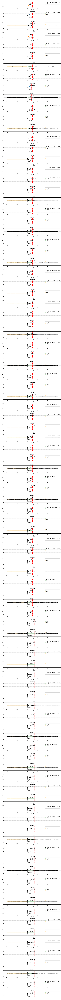

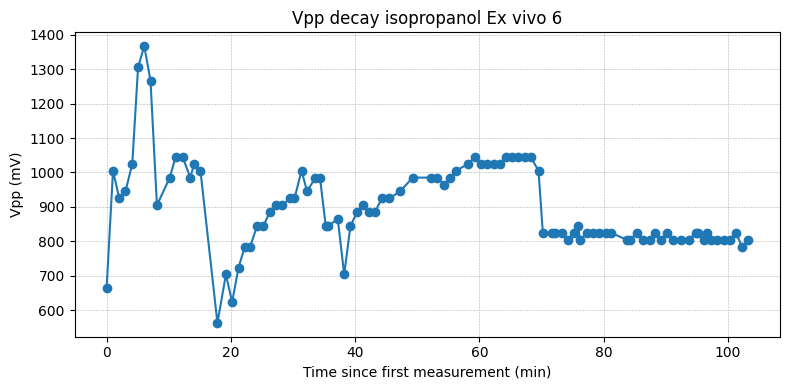

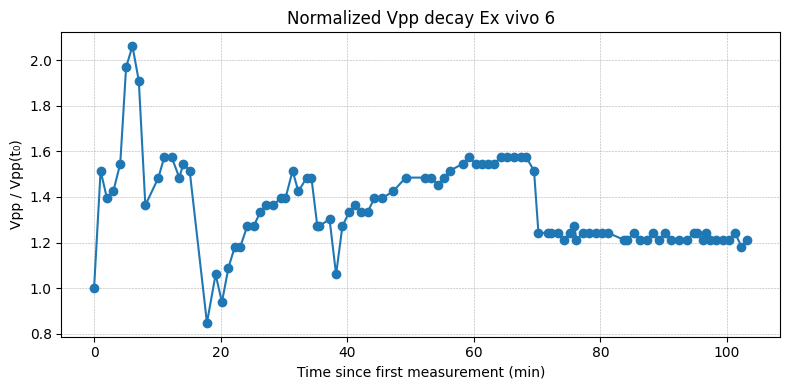


Average SNR (linear): 10.44
Average SNR (dB): 20.37 dB
Average Vpp: 897.89 mV


In [ ]:
#EX VIVO 6
folder = "Ex vivo 6"
scope_start = 514
num_files = 97

time_windows = [
    (0.5, 5.0),   # Scope_514
    (0.5, 5.0),   # Scope_515
    (0.5, 5.0),   # Scope_516
    (0.5, 5.0),   # Scope_517
    (0.5, 5.0),   # Scope_518
    (0.5, 5.0),   # Scope_519
    (0.5, 5.0),   # Scope_520
    (0.5, 5.0),   # Scope_521
    (0.5, 4.0),   # Scope_522
    (0.5, 4.0),   # Scope_523
    (0.5, 5.0),   # Scope_524
    (0.5, 5.0),   # Scope_525
    (0.5, 5.0),   # Scope_526
    (0.5, 5.0),   # Scope_527
    (0.5, 5.0),   # Scope_528
    (0.5, 5.0),   # Scope_529
    (0.5, 5.0),   # Scope_530
    (0.5, 5.0),   # Scope_531
    (0.5, 5.0),   # Scope_532
    (0.5, 5.0),   # Scope_533
    (0.5, 5.0),   # Scope_534
    (0.5, 5.0),   # Scope_535
    (0.5, 5.0),   # Scope_536
    (0.5, 5.0),   # Scope_537
    (0.5, 5.0),   # Scope_538
    (0.5, 5.0),   # Scope_539
    (0.5, 5.0),   # Scope_540
    (0.5, 5.0),   # Scope_541
    (0.5, 5.0),   # Scope_542
    (0.5, 5.0),   # Scope_543
    (0.5, 5.0),   # Scope_544
    (0.5, 5.0),   # Scope_545
    (0.5, 5.0),   # Scope_546
    (0.5, 5.0),   # Scope_547
    (0.5, 5.0),   # Scope_548
    (0.5, 5.0),   # Scope_549
    (0.5, 5.0),   # Scope_550
    (0.5, 5.0),   # Scope_551
    (0.5, 5.0),   # Scope_552
    (0.5, 5.0),   # Scope_553
    (0.5, 5.0),   # Scope_554
    (0.5, 5.0),   # Scope_555
    (0.5, 5.0),   # Scope_556
    (0.5, 5.0),   # Scope_557
    (0.5, 5.0),   # Scope_558
    (0.5, 5.0),   # Scope_559
    (0.5, 5.0),   # Scope_560
    (0.5, 5.0),   # Scope_561
    (0.5, 5.0),   # Scope_562
    (0.5, 5.0),   # Scope_563
    (0.5, 5.0),   # Scope_564
    (0.5, 5.0),   # Scope_565
    (0.5, 5.0),   # Scope_566
    (0.5, 5.0),   # Scope_567
    (0.5, 5.0),   # Scope_568
    (0.5, 5.0),   # Scope_569
    (0.5, 5.0),   # Scope_570
    (0.5, 5.0),   # Scope_571
    (0.5, 5.0),   # Scope_572
    (0.5, 5.0),   # Scope_573
    (0.5, 7.0),   # Scope_574
    (0.5, 7.0),   # Scope_575
    (0.5, 7.0),   # Scope_576
    (0.5, 7.0),   # Scope_577
    (0.5, 7.0),   # Scope_578
    (0.5, 7.0),   # Scope_579
    (0.5, 7.0),   # Scope_580
    (0.5, 7.0),   # Scope_581
    (0.5, 7.0),   # Scope_582
    (0.5, 7.0),   # Scope_583
    (0.5, 7.0),   # Scope_584
    (0.5, 7.0),   # Scope_585
    (0.5, 7.0),   # Scope_586
    (0.5, 7.0),   # Scope_587
    (0.5, 7.0),   # Scope_588
    (0.5, 7.0),   # Scope_589
    (0.5, 7.0),   # Scope_590
    (0.5, 7.0),   # Scope_591
    (0.5, 7.0),   # Scope_592
    (0.5, 7.0),   # Scope_593
    (0.5, 7.0),   # Scope_594
    (0.5, 7.0),   # Scope_595
    (0.5, 7.0),   # Scope_596
    (0.5, 7.0),   # Scope_597
    (0.5, 7.0),   # Scope_598
    (0.5, 7.0),   # Scope_599
    (0.5, 7.0),   # Scope_600
    (0.5, 7.0),   # Scope_601
    (0.5, 7.0),   # Scope_602
    (0.5, 7.0),   # Scope_603
    (0.5, 7.0),   # Scope_604
    (0.5, 7.0),   # Scope_605
    (0.5, 7.0),   # Scope_606
    (0.5, 7.0),   # Scope_607
    (0.5, 7.0),   # Scope_608
    (0.5, 7.0),   # Scope_609
    (0.5, 7.0),   # Scope_610
]

vpp_values = []
timestamps = []
snr_values = []

fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")
    t_start, t_end = time_windows[i]

    df = pd.read_csv(file_path)
    df = df.drop(index=0).reset_index(drop=True)
    df = df.apply(pd.to_numeric)

    t_ms = df["x-axis"].values * 1e3
    ch2_mV = df["2"].values * 1e3

    mtime = os.path.getmtime(file_path)
    ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
    timestamps.append(ts)
    timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")

    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    signal_vals = ch2_mV[signal_mask]
    vmax = np.max(signal_vals)
    vmin = np.min(signal_vals)
    vpp = vmax - vmin
    vpp_values.append(vpp)

    seg_indices = np.where(signal_mask)[0]
    idx_vmax = seg_indices[np.argmax(ch2_mV[seg_indices])]
    idx_vmin = seg_indices[np.argmin(ch2_mV[seg_indices])]
    vmax_t = t_ms[idx_vmax]
    vmin_t = t_ms[idx_vmin]

    signal_vrms = np.sqrt(np.mean(ch2_mV[signal_mask] ** 2))
    noise_vrms = np.sqrt(np.mean(ch2_mV[noise_mask] ** 2))
    snr = signal_vrms / noise_vrms
    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    ax.scatter(vmax_t, vmax, s=30)
    ax.scatter(vmin_t, vmin, s=30)

    ax.annotate(
        f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
        (vmax_t, vmax),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=8,
    )
    ax.annotate(
        f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
        (vmin_t, vmin),
        xytext=(5, -24),
        textcoords="offset points",
        fontsize=8,
    )

    ax.set_ylim(-2000, 2000)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

pairs = sorted(zip(timestamps, vpp_values), key=lambda x: x[0])
t0 = pairs[0][0]

time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in pairs])
vpp_arr = np.array([vpp for _, vpp in pairs])

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_arr, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp (mV)")
plt.title(f"Vpp decay isopropanol {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

vpp_norm = vpp_arr / vpp_arr[0]

plt.figure(figsize=(8, 4))
plt.plot(time_min, vpp_norm, "o-")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Vpp / Vpp(t₀)")
plt.title(f"Normalized Vpp decay {folder}")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.tight_layout()
plt.show()

snr_mean = np.mean(snr_values)
snr_mean_db = 20 * np.log10(snr_mean)
print(f"\nAverage SNR (linear): {snr_mean:.2f}")
print(f"Average SNR (dB): {snr_mean_db:.2f} dB")

vpp_mean = np.mean(vpp_values)
print(f"Average Vpp: {vpp_mean:.2f} mV")

all_norm_datasets.append({
    "time_min": time_min,
    "vpp_norm": vpp_arr / vpp_arr[0],
    "label": folder
})

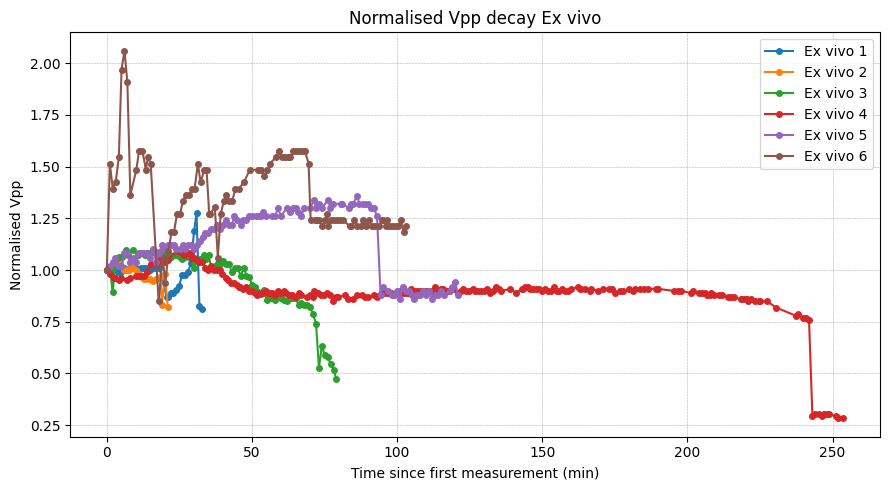

In [ ]:
# DECAY PLOT
plt.figure(figsize=(9, 5))

for data in all_norm_datasets:
    plt.plot(
        data["time_min"],
        data["vpp_norm"],
        marker="o",
        markersize=4,
        linestyle="-",
        label=data["label"]
    )

plt.xlabel("Time since first measurement (min)")
plt.ylabel("Normalised Vpp")
plt.title("Normalised Vpp decay Ex vivo")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.legend()
plt.tight_layout()
plt.show()